# `neck_l` train-set visualization

This notebook finds every image in `train/` whose segmentation mask contains class `16` (`neck_l`) and displays the full set with a highlighted overlay.


In [1]:
import os, sys

os.chdir(os.path.expanduser("~/QIAO0042/models/acv/facemask/"))
sys.path.insert(0, os.getcwd())
print("CWD:", os.getcwd())

CWD: /scratch-share/QIAO0042/models/acv/facemask


In [2]:
import wandb
api = wandb.Api()
print("default_entity:", api.default_entity)
print("viewer:", api.viewer.username)

wandb: [wandb.Api()] Loaded credentials for https://api.wandb.ai from /home/msai/qiao0042/.netrc.


default_entity: emoless584-nanyang-technological-university-singapore
viewer: emoless584


In [10]:
from math import ceil
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

from palette import label_to_rgb, rgb_to_label

CLASS_NAMES = [
    "background", "skin", "nose", "eye_g", "l_eye", "r_eye", "l_brow",
    "r_brow", "l_ear", "r_ear", "mouth", "u_lip", "l_lip", "hair",
    "hat", "ear_r", "neck_l", "neck", "cloth",
]

ROOT = Path.cwd()
if not (ROOT / "train" / "images").exists():
    ROOT = Path("/home/msai/qiao0042/QIAO0042/models/acv/facemask")

IMG_DIR = ROOT / "train" / "images"
MASK_DIR = ROOT / "train" / "masks"
CLASS_NAME = "neck_l"
CLASS_ID = CLASS_NAMES.index(CLASS_NAME)

print(f"ROOT     : {ROOT}")
print(f"IMG_DIR  : {IMG_DIR}")
print(f"MASK_DIR : {MASK_DIR}")
print(f"Class    : [{CLASS_ID}] {CLASS_NAME}")


ROOT     : /scratch-share/QIAO0042/models/acv/facemask
IMG_DIR  : /scratch-share/QIAO0042/models/acv/facemask/train/images
MASK_DIR : /scratch-share/QIAO0042/models/acv/facemask/train/masks
Class    : [16] neck_l


In [11]:
IMG_EXTS = (".png", ".jpg", ".jpeg")
records = []

for mask_path in sorted(MASK_DIR.iterdir()):
    if not mask_path.is_file() or mask_path.suffix.lower() not in IMG_EXTS:
        continue

    label = rgb_to_label(np.array(Image.open(mask_path).convert("RGB"), dtype=np.uint8))
    class_mask = label == CLASS_ID
    pixel_count = int(class_mask.sum())
    if pixel_count == 0:
        continue

    img_path = None
    for ext in IMG_EXTS:
        candidate = IMG_DIR / f"{mask_path.stem}{ext}"
        if candidate.exists():
            img_path = candidate
            break
    if img_path is None:
        raise FileNotFoundError(f"Could not find image for mask: {mask_path.name}")

    records.append({
        "fname": img_path.name,
        "img_path": img_path,
        "mask_path": mask_path,
        "neck_l_pixels": pixel_count,
    })

records = sorted(records, key=lambda row: row["neck_l_pixels"], reverse=True)

print(f"Found {len(records)} training images containing {CLASS_NAME}.")
if records:
    pixel_counts = np.array([row["neck_l_pixels"] for row in records])
    print(f"Pixel count range: {pixel_counts.min()} .. {pixel_counts.max()}")
    print("Top 10 samples by neck_l area:")
    for row in records[:10]:
        print(f"  {row['fname']}: {row['neck_l_pixels']} px")


Found 51 training images containing neck_l.
Pixel count range: 2 .. 5762
Top 10 samples by neck_l area:
  e5be8e76a4734fceaec0fd0c8a0ee837.jpg: 5762 px
  e34e375911da4990a05e325c709ca614.jpg: 4976 px
  78b8ff2a272646be8314c376cf25e1ef.jpg: 4383 px
  6429a9b76aa244f591286253c60677f8.jpg: 4109 px
  9d1747bcd028405da59652a98d827072.jpg: 2949 px
  c0424a9e31774be3aa688684e96a392a.jpg: 2413 px
  595136affe6f4ba5adfc72605d01f8d2.jpg: 2109 px
  8da1dcd1947c47e1b43780efa4f07a72.jpg: 1947 px
  01dcce9b92834fd8b7a524fc579115cd.jpg: 1571 px
  d866230e2084407386f7f4ea17cea5fe.jpg: 1469 px


In [12]:
def overlay_class(img, class_mask, color=(0.05, 0.9, 1.0), alpha=0.60):
    out = img.astype(np.float32).copy()
    tint = np.asarray(color, dtype=np.float32)
    out[class_mask] = (1.0 - alpha) * out[class_mask] + alpha * tint
    return np.clip(out, 0.0, 1.0)


def load_record(row):
    img = np.array(Image.open(row["img_path"]).convert("RGB"), dtype=np.uint8).astype(np.float32) / 255.0
    label = rgb_to_label(np.array(Image.open(row["mask_path"]).convert("RGB"), dtype=np.uint8))
    class_mask = label == CLASS_ID
    mask_rgb = label_to_rgb(label)
    return img, class_mask, mask_rgb


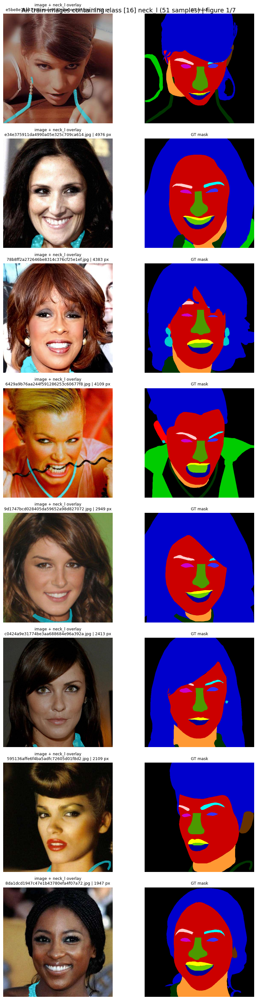

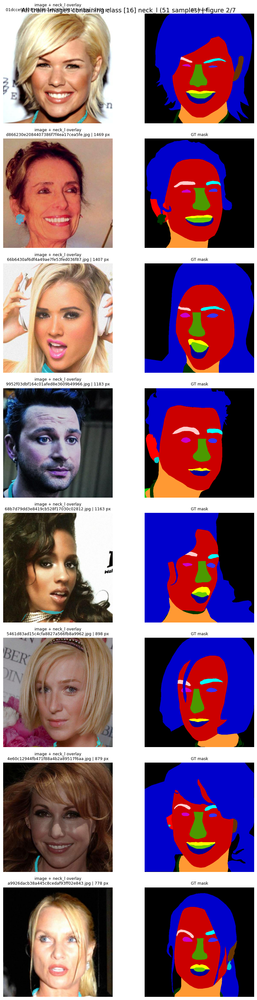

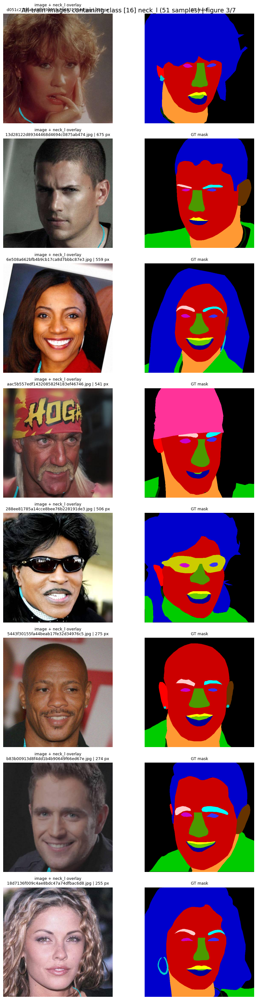

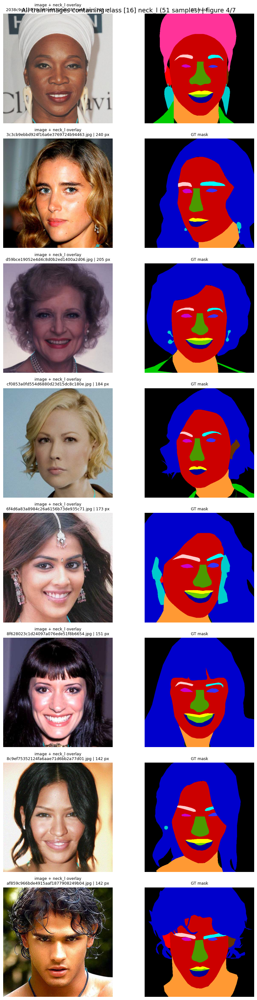

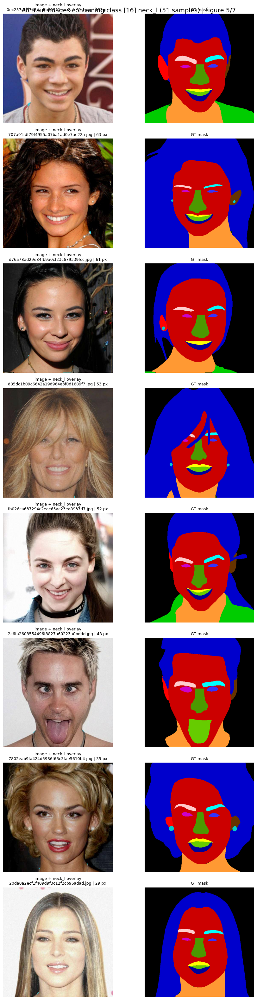

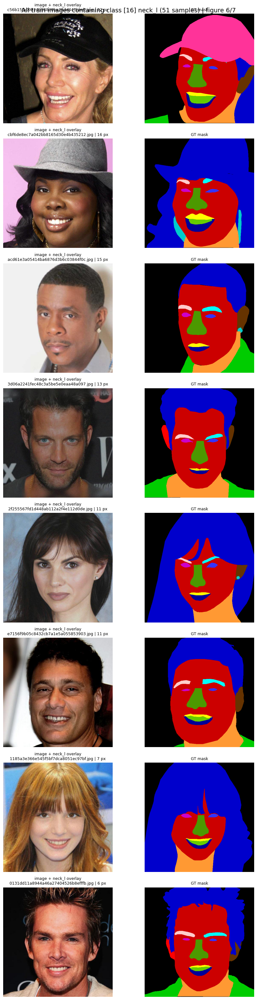

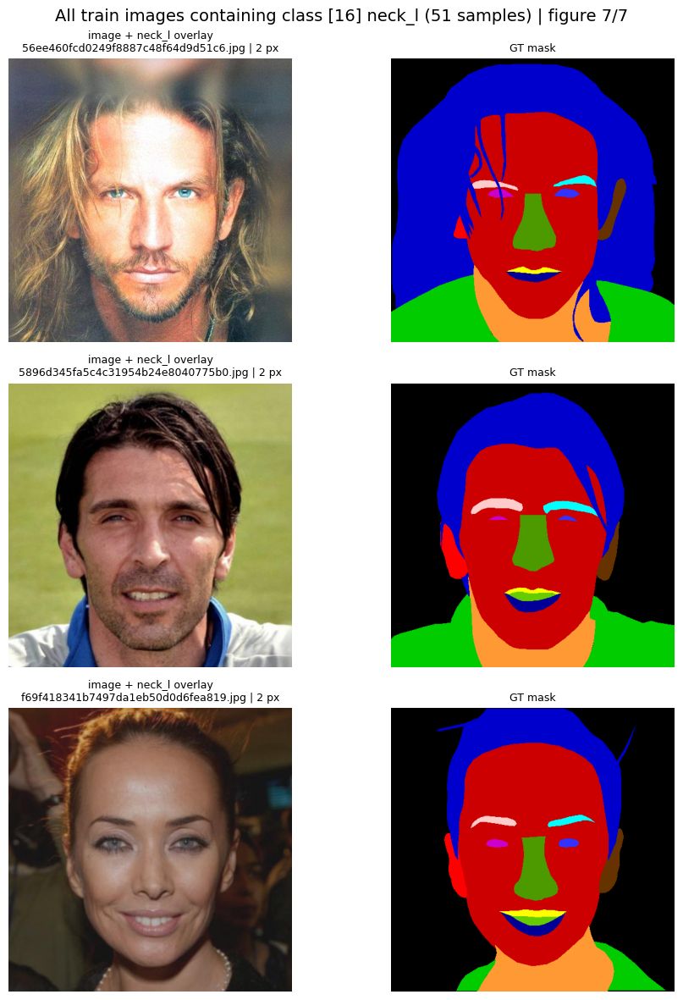

In [13]:
samples_per_figure = 8
fig_w = 10
fig_h_per_row = 4

if not records:
    raise RuntimeError(f"No training images contain class {CLASS_NAME}.")

n_figures = ceil(len(records) / samples_per_figure)

for fig_idx in range(n_figures):
    start = fig_idx * samples_per_figure
    stop = min(len(records), start + samples_per_figure)
    chunk = records[start:stop]

    fig, axes = plt.subplots(len(chunk), 2, figsize=(fig_w, len(chunk) * fig_h_per_row))
    axes = np.atleast_2d(axes)

    for row_idx, row in enumerate(chunk):
        img, class_mask, mask_rgb = load_record(row)
        axes[row_idx, 0].imshow(overlay_class(img, class_mask))
        axes[row_idx, 0].set_title(f"image + {CLASS_NAME} overlay\n{row['fname']} | {row['neck_l_pixels']} px", fontsize=9)
        axes[row_idx, 1].imshow(mask_rgb)
        axes[row_idx, 1].set_title("GT mask", fontsize=9)

        axes[row_idx, 0].axis("off")
        axes[row_idx, 1].axis("off")

    fig.suptitle(
        f"All train images containing class [{CLASS_ID}] {CLASS_NAME} ({len(records)} samples) | "
        f"figure {fig_idx + 1}/{n_figures}",
        fontsize=14,
    )
    plt.tight_layout()
    plt.show()


Found 272 training images containing ear_r.
Showing top 10 samples by ear_r area.


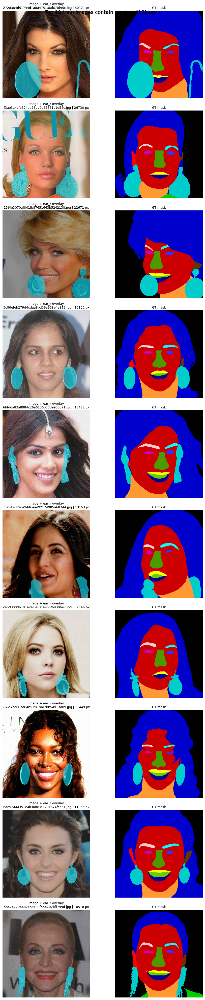

In [14]:
EAR_R_NAME = "ear_r"
EAR_R_ID = CLASS_NAMES.index(EAR_R_NAME)
ear_r_records = []

for mask_path in sorted(MASK_DIR.iterdir()):
    if not mask_path.is_file() or mask_path.suffix.lower() not in IMG_EXTS:
        continue

    label = rgb_to_label(np.array(Image.open(mask_path).convert("RGB"), dtype=np.uint8))
    class_mask = label == EAR_R_ID
    pixel_count = int(class_mask.sum())
    if pixel_count == 0:
        continue

    img_path = None
    for ext in IMG_EXTS:
        candidate = IMG_DIR / f"{mask_path.stem}{ext}"
        if candidate.exists():
            img_path = candidate
            break
    if img_path is None:
        raise FileNotFoundError(f"Could not find image for mask: {mask_path.name}")

    ear_r_records.append({
        "fname": img_path.name,
        "img_path": img_path,
        "mask_path": mask_path,
        "ear_r_pixels": pixel_count,
    })

ear_r_records = sorted(ear_r_records, key=lambda row: row["ear_r_pixels"], reverse=True)
top_ear_r_records = ear_r_records[:10]

print(f"Found {len(ear_r_records)} training images containing {EAR_R_NAME}.")
print(f"Showing top {len(top_ear_r_records)} samples by {EAR_R_NAME} area.")

if not top_ear_r_records:
    raise RuntimeError(f"No training images contain class {EAR_R_NAME}.")

fig, axes = plt.subplots(len(top_ear_r_records), 2, figsize=(10, 4 * len(top_ear_r_records)))
axes = np.atleast_2d(axes)

for row_idx, row in enumerate(top_ear_r_records):
    img = np.array(Image.open(row["img_path"]).convert("RGB"), dtype=np.uint8).astype(np.float32) / 255.0
    label = rgb_to_label(np.array(Image.open(row["mask_path"]).convert("RGB"), dtype=np.uint8))
    class_mask = label == EAR_R_ID
    mask_rgb = label_to_rgb(label)

    axes[row_idx, 0].imshow(overlay_class(img, class_mask))
    axes[row_idx, 0].set_title(f"image + {EAR_R_NAME} overlay\n{row['fname']} | {row['ear_r_pixels']} px", fontsize=9)
    axes[row_idx, 1].imshow(mask_rgb)
    axes[row_idx, 1].set_title("GT mask", fontsize=9)

    axes[row_idx, 0].axis("off")
    axes[row_idx, 1].axis("off")

fig.suptitle(f"Top {len(top_ear_r_records)} train images containing class [{EAR_R_ID}] {EAR_R_NAME}", fontsize=14)
plt.tight_layout()
plt.show()
